# **NanoGo: Efficient Deep Learning for Go under 100K Parameters**

This notebook explores lightweight neural network architectures for playing Go under a strict **100,000 parameters** constraint. We evaluate convolutional models such as **ResNet**, **MobileNet**, **Inception**, and **MNASNet**, as well as alternative approaches including **Normalization-Free Networks (NFN)**, **Hybrid CNN + Linformer**, and **EfficientNetformer**.

To further optimize model efficiency, we also investigate hybrid architectures that combine convolutional layers with attention mechanisms, aiming to leverage the strengths of both paradigms.

Models are trained on 1,000,000 self-played games from KataGo using 31 input feature planes encoding board states, ladders, and historical moves.

The evaluation focuses on policy accuracy, value prediction error (MSE), inference speed, and computational efficiency to determine the best trade-off between performance and resource constraints. The goal is to develop compact yet competitive AI agents capable of strong decision-making in Go while operating under strict computational limitations.

⚠️ Overview of training procedure

In this notebook, we adopt a unified training pipeline to evaluate multiple lightweight architectures for Go, under a 100k-parameter constraint. While the process is mostly consistent across models, MobileNet received extended training to study long-term performance evolution.

Key training details:

* Unified data pipeline and loss functions across all architectures

* Models trained on 1M self-played KataGo games using 31 input planes

* Training for up to 500 epochs, with dynamic learning rate scheduling

* Evaluation includes policy accuracy, value prediction error (MSE)

* Validation checkpoints every 20 epochs with model selection based on val_loss

* All training metrics saved as .pkl logs and plotted for visual analysis

Note: MobileNet was additionally trained beyond 500 epochs to assess long-term convergence and stability under extended training conditions.


# **Installation and Environment Setup**

In [ ]:
!wget https://www.lamsade.dauphine.fr/~cazenave/project2025.zip
!unzip project2025.zip
!ls -l

--2025-03-21 14:05:11--  https://www.lamsade.dauphine.fr/~cazenave/project2025.zip
Resolving www.lamsade.dauphine.fr (www.lamsade.dauphine.fr)... 193.48.71.250
Connecting to www.lamsade.dauphine.fr (www.lamsade.dauphine.fr)|193.48.71.250|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 486727746 (464M) [application/zip]
Saving to: ‘project2025.zip’

project2025.zip     100%[===================>] 464.18M  13.9MB/s    in 33s     

2025-03-21 14:05:45 (13.9 MB/s) - ‘project2025.zip’ saved [486727746/486727746]

Archive:  project2025.zip
  inflating: games2022.data          
  inflating: Golois.cpython-310-x86_64-linux-gnu.so  
  inflating: Golois.cpython-38-x86_64-linux-gnu.so  
  inflating: golois.cpython-310-x86_64-linux-gnu.so  
  inflating: golois.cpython-311-x86_64-linux-gnu.so  
  inflating: golois.cpython-37m-x86_64-linux-gnu.so  
  inflating: golois.cpython-38-x86_64-linux-gnu.so  
  inflating: trainGolois.py          
total 2382016
-rw-r--r-- 1 root root 

In [ ]:
!pip install tensorrt-bindings==8.6.1
!pip install --extra-index-url https://pypi.nvidia.com tensorrt-libs
!pip install tensorflow[and-cuda]==2.15.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 980.8/980.8 kB 19.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://pypi.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 824.8/824.8 MB 49.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.8/417.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.9/13.9 MB 110.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 95.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.4/23.4 MB 94.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 845.8/845.8 kB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 720.1/720.1 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 23.2 MB/s eta 0:00:00
   ━━━━━

# **Resnet**

### Model Architecture Overview

This model is a compact **ResNet-like architecture** tailored for the game of **Go**. It processes input tensors of shape **19×19×31**, representing the board state across multiple feature planes.

**Architecture breakdown:**

- **Input Layer**  
  Combines two parallel convolutions (5×5 and 1×1) to capture both local patterns and global context. The outputs are added and passed through a ReLU activation.

- **Residual Blocks ×6**  
  Each block applies two 3×3 convolutions with batch normalization and ReLU activations. A skip connection adds the input back to the output to preserve gradient flow and stabilize training.

- **Policy Head**  
  - 1×1 convolution to reduce feature dimensionality  
  - Batch normalization + ReLU  
  - Another 1×1 convolution  
  - Flatten + softmax to output a probability distribution over the **361 possible board positions**

- **Value Head**  
  - Global average pooling over the feature maps  
  - Two dense (fully connected) layers with ReLU, ending with a sigmoid activation  
  - Outputs a scalar between 0 and 1 representing the win probability for the current player

The model uses only **25 filters per layer**, making it highly parameter-efficient while maintaining strong representational capacity.


# ================================
#         Architecture
# ================================



In [ ]:
import os
import gc
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import pickle
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
import golois
import absl.logging

# Disable Abseil warnings
absl.logging.set_verbosity(absl.logging.ERROR)

# Dimensions
planes = 31
moves = 361
N = 10000
epochs = 500
batch = 128
filters = 25
blocks = 6
reg_strength = 0.00001

# Data generation
input_data = np.random.randint(2, size=(N, 19, 19, planes)).astype('float32')
policy = keras.utils.to_categorical(np.random.randint(moves, size=(N,)))
value = np.random.randint(2, size=(N,)).astype('float32')
end = np.random.randint(2, size=(N, 19, 19, 2)).astype('float32')
groups = np.zeros((N, 19, 19, 1)).astype('float32')

golois.getValidation(input_data, policy, value, end)

# Residual block
def resnet_block(inputs, filters):
    shortcut = inputs
    x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Add()([shortcut, x])
    x = layers.ReLU()(x)
    return x

# Input layer
def input_residual_layer(inputs, filters):
    conv_5x5 = layers.Conv2D(filters, (5, 5), padding='same', use_bias=False)(inputs)
    conv_1x1 = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)(inputs)
    x = layers.Add()([conv_5x5, conv_1x1])
    x = layers.ReLU()(x)
    return x

# Model definition
input_layer = keras.Input(shape=(19, 19, planes), name='board')
x = input_residual_layer(input_layer, filters)

for _ in range(blocks):
    x = resnet_block(x, filters)

# Policy head
policy_head = layers.Conv2D(128, (1, 1), use_bias=False)(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Activation('relu')(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(50)(value_head)
value_head = layers.Activation('relu')(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])


model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 19, 19, 25)           19375     ['board[0][0]']               
                                                                                                  
 conv2d_1 (Conv2D)           (None, 19, 19, 25)           775       ['board[0][0]']               
                                                                                                  
 add (Add)                   (None, 19, 19, 25)           0         ['conv2d[0][0]',              
                                                                     'conv2d_1[0][0]']        

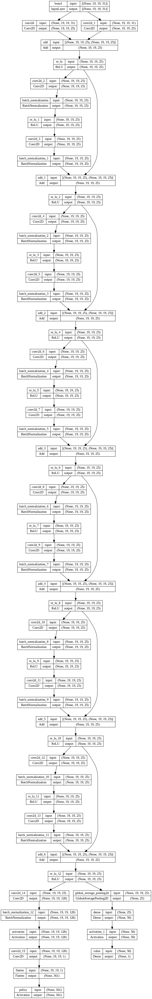

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image, display

plot_model(
    model,
    to_file="resnet_architecture.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
    dpi=100
)

try:
    display(Image(filename="resnet_architecture.png"))
except Exception as e:
    print("Architecture enregistrée sous 'resnet_architecture.png'.")
    print(f"(Affichage non supporté ici. Erreur : {e})")

# ================================
#          🏋️‍♂️ TRAINING
# ================================



Model: "model_31"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_444 (Conv2D)         (None, 19, 19, 25)           19375     ['board[0][0]']               
                                                                                                  
 conv2d_445 (Conv2D)         (None, 19, 19, 25)           775       ['board[0][0]']               
                                                                                                  
 add_191 (Add)               (None, 19, 19, 25)           0         ['conv2d_444[0][0]',          
                                                                     'conv2d_445[0][0]']   

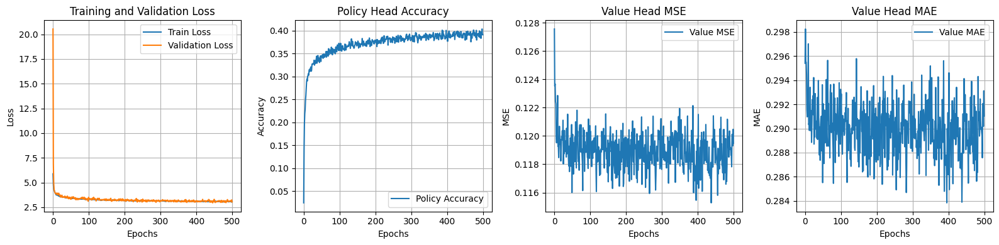

In [ ]:
import os
import gc
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import pickle
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
import golois
import absl.logging

# Disable Abseil warnings
absl.logging.set_verbosity(absl.logging.ERROR)

# Dimensions
planes = 31
moves = 361
N = 10000
epochs = 500
batch = 128
filters = 25
blocks = 6
reg_strength = 0.00001

# Data generation
input_data = np.random.randint(2, size=(N, 19, 19, planes)).astype('float32')
policy = keras.utils.to_categorical(np.random.randint(moves, size=(N,)))
value = np.random.randint(2, size=(N,)).astype('float32')
end = np.random.randint(2, size=(N, 19, 19, 2)).astype('float32')
groups = np.zeros((N, 19, 19, 1)).astype('float32')

golois.getValidation(input_data, policy, value, end)

# Residual Block
def resnet_block(inputs, filters):
    shortcut = inputs
    x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Add()([shortcut, x])
    x = layers.ReLU()(x)
    return x

# Input layer
def input_residual_layer(inputs, filters):
    conv_5x5 = layers.Conv2D(filters, (5, 5), padding='same', use_bias=False)(inputs)
    conv_1x1 = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)(inputs)
    x = layers.Add()([conv_5x5, conv_1x1])
    x = layers.ReLU()(x)
    return x

# Model definition
input_layer = keras.Input(shape=(19, 19, planes), name='board')
x = input_residual_layer(input_layer, filters)

for _ in range(blocks):
    x = resnet_block(x, filters)

# Policy head
policy_head = layers.Conv2D(128, (1, 1), use_bias=False)(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Activation('relu')(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(50)(value_head)
value_head = layers.Activation('relu')(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

# Dynamic learning Rate Schedule
def lr_schedule(epoch):
    if epoch < 100:
        return 0.005
    elif epoch < 150:
        return 0.0005
    elif epoch < 200:
        return 0.00005
    elif epoch < 300:
        return 0.000005
    elif epoch < 400:
        return 0.0000005
    else:
        return 0.00000005

lr_scheduler = LearningRateScheduler(lr_schedule)

model.compile(optimizer=keras.optimizers.Adam(),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              metrics={'policy': 'categorical_accuracy', 'value': ['mse', 'mae']})

model.summary()

# Callbacks
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint('go_best_model.h5', monitor='val_loss', save_best_only=True, mode='min')

# Training loop
history_dict = {'loss': [], 'val_loss': [], 'policy_categorical_accuracy': [], 'value_mse': [], 'value_mae': []}

for i in range(1, epochs + 1):
    print(f'Epoch {i}/{epochs}')
    golois.getBatch(input_data, policy, value, end, groups, i * N)
    history = model.fit(input_data, {'policy': policy, 'value': value}, epochs=1, batch_size=batch,
                        validation_split=0.1, callbacks=[checkpoint, early_stopping, lr_scheduler], verbose=1)

    history_dict['loss'].append(history.history['loss'][0])
    history_dict['val_loss'].append(history.history['val_loss'][0])
    history_dict['policy_categorical_accuracy'].append(history.history['policy_categorical_accuracy'][0])
    history_dict['value_mse'].append(history.history['value_mse'][0])
    history_dict['value_mae'].append(history.history['value_mae'][0])

    if i % 5 == 0:
        gc.collect()

    if i % 20 == 0:
        golois.getValidation(input_data, policy, value, end)
        val = model.evaluate(input_data, [policy, value], verbose=0, batch_size=batch)
        print(f"Validation: {val}")

# Save logs
with open('training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

# Load best model
best_model = keras.models.load_model('go_best_model.h5')

# Save learning curves
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()

plt.subplot(1, 4, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()

plt.subplot(1, 4, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()

plt.subplot(1, 4, 4)
plt.plot(history_dict['value_mae'], label='Value MAE')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()
plt.title('Value Head MAE')
plt.grid()

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# Save logs again at the end
with open('final_training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

##**Mobilenet**

### Model Architecture Overview

This model is a lightweight convolutional architecture inspired by **MobileNet**, adapted for the game of **Go**. It takes as input a **19×19×31** tensor representing the board state.

**Architecture breakdown:**

- **Input Layer**  
  A 3×3 convolution followed by batch normalization and ReLU to extract initial spatial features.

- **MobileNet-style Blocks ×6**  
  Each block follows a **depthwise separable structure**:
  - A 1×1 convolution expands the number of channels
  - Two parallel **depthwise convolutions** (3×3 and 5×5) extract spatial features at different scales
  - The outputs are concatenated, normalized, and activated (ReLU)
  - A 1×1 **projection layer** reduces the channels back to the base dimension  
  - A **Squeeze-and-Excitation (SE) block** recalibrates feature importance across channels  
  - A **residual connection** adds the input to the output to facilitate training

- **Policy Head**  
  - 1×1 convolution  
  - Batch normalization + ReLU  
  - Another 1×1 convolution  
  - Flatten + softmax to output a probability distribution over the **361 board positions**

- **Value Head**  
  - Global average pooling  
  - Two dense layers with ReLU, ending with a sigmoid  
  - Outputs the **win probability** for the current player

The use of **depthwise convolutions** and **channel-efficient design** keeps the model lightweight, with only **25 base filters**, while still allowing it to learn expressive board patterns.


# ================================
#         Architecture
# ================================



In [ ]:
filters = 32
blocks = 5

def SE_Block(inputs, ratio=16):
    """Squeeze and Excitation block."""
    filters = inputs.shape[-1]

    # GlobalAveragePooling
    se = layers.GlobalAveragePooling2D()(inputs)
    # Reshape
    se = layers.Reshape((1, 1, filters))(se)
    # Two dense layers
    se = layers.Dense(filters // ratio, activation='relu')(se)
    se = layers.Dense(filters, activation='sigmoid')(se)
    # Apply scaling
    outputs = layers.Multiply()([inputs, se])

    return outputs

def dual_path_block(inputs):
    x = inputs

    # First convolution to expand channels
    x = layers.Conv2D(128, (1, 1), use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Dual path with depthwise convolutions (3x3 and 5x5)
    path1 = layers.DepthwiseConv2D((3, 3), padding='same', use_bias=False)(x)
    path2 = layers.DepthwiseConv2D((5, 5), padding='same', use_bias=False)(x)

    # Concatenate paths
    x = layers.Concatenate()([path1, path2])

    # Batch normalization and activation
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Projection back to original dimension
    x = layers.Conv2D(filters, (1, 1), use_bias=False)(x)
    x = layers.BatchNormalization()(x)

    # SE block
    x = SE_Block(x)

    # Residual connection
    outputs = layers.Add()([inputs, x])

    return outputs

# Model
input_layer = keras.Input(shape=(19, 19, planes), name='board')

# Initial convolution
x = layers.Conv2D(filters, (3, 3), padding='same')(input_layer)
x = layers.BatchNormalization()(x)
x = layers.Activation('relu')(x)

# Stack of blocks
for _ in range(blocks):
    x = dual_path_block(x)

# Policy head
policy_head = layers.Conv2D(128, (1, 1), use_bias=False)(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Activation('relu')(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(50)(value_head)
value_head = layers.Activation('relu')(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_103 (Conv2D)         (None, 19, 19, 32)           8960      ['board[0][0]']               
                                                                                                  
 batch_normalization_36 (Ba  (None, 19, 19, 32)           128       ['conv2d_103[0][0]']          
 tchNormalization)                                                                                
                                                                                                  
 activation_17 (Activation)  (None, 19, 19, 32)           0         ['batch_normalization_36

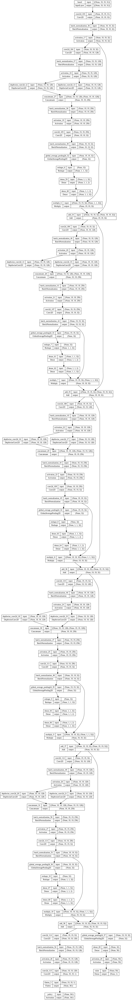

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image, display

plot_model(
    model,
    to_file="mobilenet_architecture.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
    dpi=100
)

try:
    display(Image(filename="mobilenet_architecture.png"))
except Exception as e:
    print("Architecture enregistrée sous 'resnet_architecture.png'.")
    print(f"(Affichage non supporté ici. Erreur : {e})")

# ================================
#          🏋️‍♂️ TRAINING
# ================================



In [ ]:
import os
import gc
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
import matplotlib.pyplot as plt
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint
import golois
import absl.logging

# Disable Abseil warnings
absl.logging.set_verbosity(absl.logging.ERROR)

# Dimensions
planes = 31
moves = 361
N = 10000
epochs = 10000
batch = 128
filters = 32
blocks = 5
reg_strength = 0.00001

# Data generation

input_data = np.random.randint(2, size=(N, 19, 19, planes))
input_data = input_data.astype ('float32')

policy = np.random.randint(moves, size=(N,))
policy = keras.utils.to_categorical (policy)

value = np.random.randint(2, size=(N,))
value = value.astype ('float32')

end = np.random.randint(2, size=(N, 19, 19, 2))
end = end.astype ('float32')

groups = np.zeros((N, 19, 19, 1))
groups = groups.astype ('float32')

print ("getValidation", flush = True)
golois.getValidation (input_data, policy, value, end)


def SE_Block(inputs, ratio=16):
    """Squeeze and Excitation block."""
    filters = inputs.shape[-1]

    # GlobalAveragePooling
    se = layers.GlobalAveragePooling2D()(inputs)
    # Reshape
    se = layers.Reshape((1, 1, filters))(se)
    # Two dense layers
    se = layers.Dense(filters // ratio, activation='relu')(se)
    se = layers.Dense(filters, activation='sigmoid')(se)
    # Apply scaling
    outputs = layers.Multiply()([inputs, se])

    return outputs

def dual_path_block(inputs):
    """Dual depthwise convolution block with SE and residual."""
    x = inputs

    # First convolution to expand channels
    x = layers.Conv2D(128, (1, 1), use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Dual path with depthwise convolutions (3x3 and 5x5)
    path1 = layers.DepthwiseConv2D((3, 3), padding='same', use_bias=False)(x)
    path2 = layers.DepthwiseConv2D((5, 5), padding='same', use_bias=False)(x)

    # Concatenate paths
    x = layers.Concatenate()([path1, path2])

    # Batch normalization and activation
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Projection back to original dimension
    x = layers.Conv2D(filters, (1, 1), use_bias=False)(x)
    x = layers.BatchNormalization()(x)

    # SE block
    x = SE_Block(x)

    # Residual connection
    outputs = layers.Add()([inputs, x])

    return outputs

def cosine_annealing(epoch, epochs, lr_min=0.00001, lr_max=0.001):
    return lr_min + 0.5 * (lr_max - lr_min) * (1 + np.cos(np.pi * epoch / epochs))

# Model
input_layer = keras.Input(shape=(19, 19, planes), name='board')

# Initial convolution
x = layers.Conv2D(filters, (3, 3), padding='same')(input_layer)
x = layers.BatchNormalization()(x)
x = layers.Activation('relu')(x)

# Stack of blocks
for _ in range(blocks):
    x = dual_path_block(x)

# Policy head
policy_head = layers.Conv2D(128, (1, 1), use_bias=False)(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Activation('relu')(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(50)(value_head)
value_head = layers.Activation('relu')(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])
model.compile(optimizer=keras.optimizers.Adam(learning_rate=cosine_annealing(0, epochs)),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              loss_weights={'policy': 1.0, 'value': 1.0},
              metrics={'policy': 'categorical_accuracy', 'value': 'mse'})

model.summary()

# Callbacks
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint('go_best_model.h5', monitor='val_loss', save_best_only=True, mode='min', save_weights_only=False)

# Training
history_dict = {'loss': [], 'val_loss': [], 'policy_categorical_accuracy': [], 'value_mse': []}

for i in range(1, epochs + 1):
    print(f'Epoch {i}/{epochs}')
    golois.getBatch(input_data, policy, value, end, groups, i * N)
    history = model.fit(input_data, {'policy': policy, 'value': value}, epochs=1, batch_size=batch, validation_split=0.1, callbacks=[checkpoint, early_stopping], verbose=1)

    history_dict['loss'].append(history.history['loss'][0])
    history_dict['val_loss'].append(history.history['val_loss'][0])
    history_dict['policy_categorical_accuracy'].append(history.history['policy_categorical_accuracy'][0])
    history_dict['value_mse'].append(history.history['value_mse'][0])

    if i % 5 == 0:
        gc.collect()

    if i % 20 == 0:
        golois.getValidation(input_data, policy, value, end)
        val = model.evaluate(input_data, [policy, value], verbose=0, batch_size=batch)
        print(f"Validation: {val}")

# Load best model
best_model = keras.models.load_model('go_best_model.h5')

# Save learning curves
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

getValidation
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 19, 19, 32)           8960      ['board[0][0]']               
                                                                                                  
 batch_normalization (Batch  (None, 19, 19, 32)           128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 19, 19, 32)           0         ['batch_norm

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
71/71 [==============================] - 2s 33ms/step - loss: 2.5441 - policy_loss: 1.9743 - value_loss: 0.5698 - policy_categorical_accuracy: 0.4582 - value_mse: 0.0712 - val_loss: 2.5725 - val_policy_loss: 1.9965 - val_value_loss: 0.5760 - val_policy_categorical_accuracy: 0.4330 - val_value_mse: 0.0728
Epoch 2976/10000
71/71 [==============================] - 2s 33ms/step - loss: 2.5205 - policy_loss: 1.9418 - value_loss: 0.5787 - policy_categorical_accuracy: 0.4600 - value_mse: 0.0730 - val_loss: 2.6005 - val_policy_loss: 2.0194 - val_value_loss: 0.5811 - val_policy_categorical_accuracy: 0.4370 - val_value_mse: 0.0736
Epoch 2977/10000
71/71 [==============================] - 2s 33ms/step - loss: 2.5521 - policy_loss: 1.9767 - value_loss: 0.5754 - policy_categorical_accuracy: 0.4553 - value_mse: 0.0739 - val_loss: 2.5296 - val_policy_loss: 1.9291 - val_value_loss: 0.6004 - val_policy_categorical_accuracy: 0

KeyboardInterrupt: 

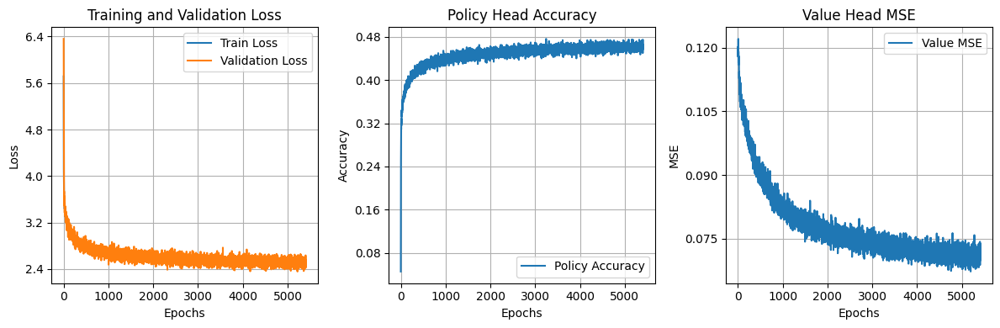

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Load best model
best_model = keras.models.load_model('go_best_model.h5')

# Save learning curves
plt.figure(figsize=(12, 4))

# Training and Validation Loss
plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

# Policy Head Accuracy
plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

# Value Head MSE
plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()


### Fine-tuning Overview

This version fine-tunes a pretrained model using **CBAM attention modules** inserted after each bottleneck block to enhance spatial and channel-wise feature focus. The training leverages the **AdamW optimizer** with **cosine annealing** for smooth learning rate decay, along with stronger regularization via **L2 weight decay** and **dropout**. The model is trained on synthetic data for **1200 epochs**, with early stopping and model checkpointing to retain the best weights.


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import gc
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler
import golois

# CBAM Module
class CBAM(tf.keras.layers.Layer):
    def __init__(self, filters, ratio=8):
        super(CBAM, self).__init__()
        self.filters = filters
        self.ratio = ratio

        # Channel Attention
        self.global_avg_pool = layers.GlobalAveragePooling2D()
        self.global_max_pool = layers.GlobalMaxPooling2D()
        self.dense1 = layers.Dense(filters // ratio, activation='relu', use_bias=False)
        self.dense2 = layers.Dense(filters, activation='sigmoid', use_bias=False)

        # Spatial Attention
        self.conv2d = layers.Conv2D(1, kernel_size=7, padding='same', activation='sigmoid')

    def call(self, x):
        # Channel Attention
        avg_pool = self.dense2(self.dense1(self.global_avg_pool(x)))
        max_pool = self.dense2(self.dense1(self.global_max_pool(x)))
        channel_attention = tf.keras.activations.sigmoid(avg_pool + max_pool)
        channel_attention = tf.reshape(channel_attention, (-1, 1, 1, self.filters))
        x = x * channel_attention

        # Spatial Attention
        spatial_attention = self.conv2d(tf.reduce_mean(x, axis=-1, keepdims=True))
        x = x * spatial_attention
        return x

# Fonction de cosine annealing
def cosine_annealing(epoch, epochs, lr_min=0.00001, lr_max=0.00005):
    return lr_min + 0.5 * (lr_max - lr_min) * (1 + np.cos(np.pi * epoch / epochs))

# Model loading
model_path = "/content/model_nanogobest.h5"
model = tf.keras.models.load_model(model_path, custom_objects={'CBAM': CBAM})

# Hyperparameters
batch_size = 128
epochs = 1200
reg_strength = 0.0002
dropout_rate = 0.4
initial_lr = 0.00005


lr_schedule = LearningRateScheduler(lambda epoch: cosine_annealing(epoch, epochs))

model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=initial_lr),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              loss_weights={'policy': 1.0, 'value': 1.0},
              metrics={'policy': 'categorical_accuracy', 'value': 'mse'})

# Data generation
N = 10000
planes = 31
moves = 361

input_data = np.zeros((N, 19, 19, planes), dtype=np.float32)
policy = np.zeros((N, moves), dtype=np.float32)
value = np.zeros((N,), dtype=np.float32)
end = np.zeros((N, 19, 19, 2), dtype=np.float32)
groups = np.zeros((N, 19, 19, 1), dtype=np.float32)

golois.getValidation(input_data, policy, value, end)

# Adding Cbam after each bottleneck
def bottleneck_block(x, expand_ratio=4):
    input_channels = x.shape[-1]
    expand_channels = input_channels * expand_ratio

    m = layers.Conv2D(expand_channels, (1,1), kernel_regularizer=regularizers.l2(reg_strength), use_bias=False)(x)
    m = layers.BatchNormalization()(m)
    m = layers.Activation('swish')(m)

    m = layers.DepthwiseConv2D((3,3), padding='same', use_bias=False)(m)
    m = layers.BatchNormalization()(m)
    m = layers.Activation('swish')(m)

    m = layers.Conv2D(input_channels, (1,1), kernel_regularizer=regularizers.l2(reg_strength), use_bias=False)(m)
    m = layers.BatchNormalization()(m)

    m = CBAM(input_channels)(m)
    m = layers.Dropout(dropout_rate)(m)
    return layers.Add()([m, x])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
checkpoint = ModelCheckpoint('improved_model.h5', monitor='val_loss', save_best_only=True, mode='min', save_weights_only=False)

model.summary()

# Training
history_dict = {'loss': [], 'val_loss': [], 'policy_categorical_accuracy': [], 'value_mse': []}

for i in range(1, epochs + 1):
    print(f'Epoch {i}/{epochs}')
    golois.getBatch(input_data, policy, value, end, groups, i * N)
    history = model.fit(input_data, {'policy': policy, 'value': value}, epochs=1, batch_size=batch_size, validation_split=0.1, callbacks=[checkpoint, early_stopping, lr_schedule], verbose=1)

    history_dict['loss'].append(history.history['loss'][0])
    history_dict['val_loss'].append(history.history['val_loss'][0])
    history_dict['policy_categorical_accuracy'].append(history.history['policy_categorical_accuracy'][0])
    history_dict['value_mse'].append(history.history['value_mse'][0])

    if i % 5 == 0:
        gc.collect()

    if i % 20 == 0:
        golois.getValidation(input_data, policy, value, end)
        val = model.evaluate(input_data, [policy, value], verbose=0, batch_size=batch_size)
        print(f"Validation: {val}")

fine_tuned_model = tf.keras.models.load_model('improved_model.h5', custom_objects={'CBAM': CBAM})

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 19, 19, 32)           8960      ['board[0][0]']               
                                                                                                  
 batch_normalization (Batch  (None, 19, 19, 32)           128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 19, 19, 32)           0         ['batch_normalization[0][0

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


71/71 [==============================] - 19s 54ms/step - loss: 2.5170 - policy_loss: 1.9415 - value_loss: 0.5755 - policy_categorical_accuracy: 0.4600 - value_mse: 0.0698 - val_loss: 2.4742 - val_policy_loss: 1.9176 - val_value_loss: 0.5565 - val_policy_categorical_accuracy: 0.4630 - val_value_mse: 0.0715 - lr: 5.0000e-05
Epoch 2/1200
71/71 [==============================] - 3s 36ms/step - loss: 2.4952 - policy_loss: 1.9227 - value_loss: 0.5725 - policy_categorical_accuracy: 0.4669 - value_mse: 0.0710 - val_loss: 2.4003 - val_policy_loss: 1.8321 - val_value_loss: 0.5683 - val_policy_categorical_accuracy: 0.4990 - val_value_mse: 0.0686 - lr: 5.0000e-05
Epoch 3/1200
71/71 [==============================] - 2s 32ms/step - loss: 2.4904 - policy_loss: 1.9192 - value_loss: 0.5712 - policy_categorical_accuracy: 0.4693 - value_mse: 0.0701 - val_loss: 2.5685 - val_policy_loss: 2.0020 - val_value_loss: 0.5666 - val_policy_categorical_accuracy: 0.4580 - val_value_mse: 0.0692 - lr: 5.0000e-05
Epoc

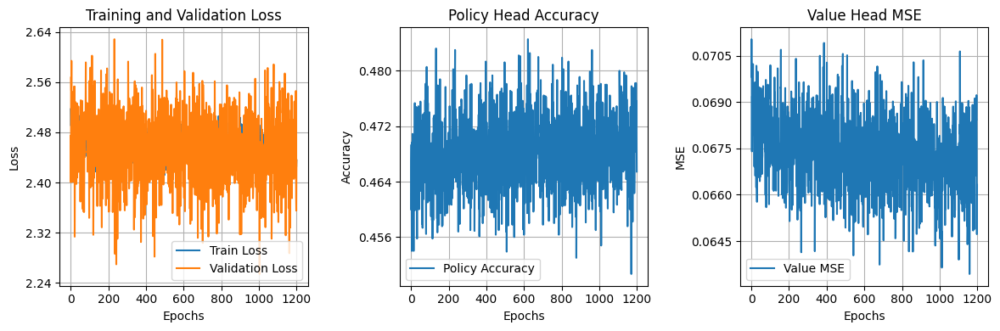

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import tensorflow.keras as keras


# Load best model
best_model = keras.models.load_model('/content/improved_model.h5')

# Save learning curves
plt.figure(figsize=(12, 4))

# Training and Validation Loss
plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

# Policy head accuracy
plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

# Value head MSE
plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# **Inception**

###  Model Architecture Overview

This model is a lightweight convolutional architecture inspired by **MobileNet**, **Inception**, and **EfficientNet-style** ideas, adapted for the game of **Go** under a strict 100,000-parameter constraint. It processes a **19×19×31** input tensor representing the board state with multiple feature planes.

**Architecture breakdown:**

- **Input Layer**  
  A 1×1 convolution with `swish` activation is applied to align the number of channels and prepare the input for efficient multi-branch processing.

- **Inception-CBAM Blocks ×6**  
  Each block includes:
  - A 1×1 convolution (pointwise) for local feature mixing  
  - Two **depthwise separable convolutions**: 3×3 and 5×5 for spatial diversity  
  - Concatenation of all branches for rich representation  
  - 1×1 projection to reduce channel dimensions  
  - A **CBAM attention module** combining **channel** and **spatial** attention  
  - A **residual connection** to aid in training and preserve information

- **Policy Head**  
  - 1×1 convolution with swish activation  
  - Batch normalization  
  - 1×1 projection to a single channel  
  - Flatten + softmax → outputs a probability distribution over **361 board positions**

- **Value Head**  
  - Global average pooling  
  - Dense layer with swish activation  
  - Dropout for regularization  
  - Final dense layer with sigmoid → predicts the **win probability** for the current player

By using **depthwise separable convolutions**, **attention mechanisms**, and **multi-scale design**, this model maintains strong performance while respecting strict parameter constraints. With only **41 base filters**, it achieves a compact and expressive representation suited for the complexity of Go.


# ================================
#         Architecture
# ================================



In [ ]:

filters = 41
blocks = 6

# CBAM Attention
class CBAM(tf.keras.layers.Layer):
    def __init__(self, filters, ratio=8):
        super(CBAM, self).__init__()
        self.filters = filters
        self.ratio = ratio

        # Channel Attention
        self.global_avg_pool = layers.GlobalAveragePooling2D()
        self.global_max_pool = layers.GlobalMaxPooling2D()
        self.dense1 = layers.Dense(filters // ratio, activation='relu', use_bias=False)
        self.dense2 = layers.Dense(filters, activation='sigmoid', use_bias=False)

        # Spatial Attention
        self.conv2d = layers.Conv2D(1, kernel_size=7, padding='same', activation='sigmoid')

    def call(self, x):
        # Channel Attention
        avg_pool = self.dense2(self.dense1(self.global_avg_pool(x)))
        max_pool = self.dense2(self.dense1(self.global_max_pool(x)))
        channel_attention = tf.keras.activations.sigmoid(avg_pool + max_pool)
        channel_attention = tf.reshape(channel_attention, (-1, 1, 1, self.filters))
        x = x * channel_attention

        # Spatial Attention
        spatial_attention = self.conv2d(tf.reduce_mean(x, axis=-1, keepdims=True))
        x = x * spatial_attention
        return x

# Inception block with CBAM and skip connection
def inception_block(inputs, filters):
    conv1x1 = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False, activation='swish')(inputs)
    depthwise3x3 = layers.SeparableConv2D(filters, (3, 3), padding='same', use_bias=False, activation='swish')(inputs)
    depthwise5x5 = layers.SeparableConv2D(filters, (5, 5), padding='same', use_bias=False, activation='swish')(inputs)

    x = layers.Concatenate()([conv1x1, depthwise3x3, depthwise5x5])
    x = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False, activation='swish')(x)
    x = CBAM(filters)(x)

    if inputs.shape[-1] != filters:
        inputs = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)(inputs)

    x = layers.Add()([x, inputs])  # Skip connection
    return x

# Input layer
input_layer = keras.Input(shape=(19, 19, planes), name='board')
x = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False, activation='swish')(input_layer)
x = inception_block(x, filters)

for _ in range(blocks):
    x = inception_block(x, filters)

# Policy head
policy_head = layers.Conv2D(128, (1, 1), use_bias=False, activation='swish', kernel_regularizer=regularizers.l2(reg_strength))(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(80, activation='swish')(value_head)
value_head = layers.Dropout(0.3)(value_head)  # Dropout pour régularisation
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])


model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_79 (Conv2D)          (None, 19, 19, 41)           1271      ['board[0][0]']               
                                                                                                  
 conv2d_80 (Conv2D)          (None, 19, 19, 41)           1681      ['conv2d_79[0][0]']           
                                                                                                  
 separable_conv2d_28 (Separ  (None, 19, 19, 41)           2050      ['conv2d_79[0][0]']           
 ableConv2D)                                                                                

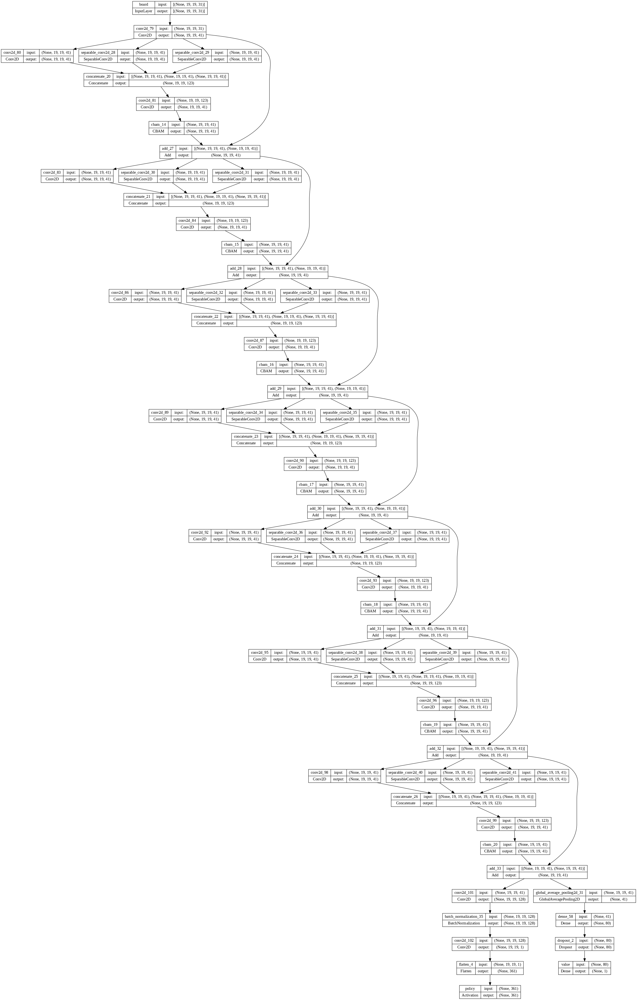

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image, display

plot_model(
    model,
    to_file="inception_architecture.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
    dpi=100
)

try:
    display(Image(filename="inception_architecture.png"))
except Exception as e:
    print("Architecture enregistrée sous 'resnet_architecture.png'.")
    print(f"(Affichage non supporté ici. Erreur : {e})")

# ================================
#          🏋️‍♂️ TRAINING
# ================================



In [ ]:
import os
import gc
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import pickle
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import golois
import absl.logging

absl.logging.set_verbosity(absl.logging.ERROR)

# Dimensions
planes = 31
moves = 361
N = 10000
epochs = 500
batch = 64
filters = 41
blocks = 6
reg_strength = 0.0001
max_params = 100000

# Data generation
np.random.seed(42)
input_data = np.random.randint(2, size=(N, 19, 19, planes)).astype('float32')
policy = keras.utils.to_categorical(np.random.randint(moves, size=(N,)))
value = np.random.randint(2, size=(N,)).astype('float32')
end = np.random.randint(2, size=(N, 19, 19, 2)).astype('float32')
groups = np.zeros((N, 19, 19, 1)).astype('float32')

golois.getValidation(input_data, policy, value, end)

# CBAM Attention
class CBAM(tf.keras.layers.Layer):
    def __init__(self, filters, ratio=8):
        super(CBAM, self).__init__()
        self.filters = filters
        self.ratio = ratio

        # Channel Attention
        self.global_avg_pool = layers.GlobalAveragePooling2D()
        self.global_max_pool = layers.GlobalMaxPooling2D()
        self.dense1 = layers.Dense(filters // ratio, activation='relu', use_bias=False)
        self.dense2 = layers.Dense(filters, activation='sigmoid', use_bias=False)

        # Spatial Attention
        self.conv2d = layers.Conv2D(1, kernel_size=7, padding='same', activation='sigmoid')

    def call(self, x):
        # Channel Attention
        avg_pool = self.dense2(self.dense1(self.global_avg_pool(x)))
        max_pool = self.dense2(self.dense1(self.global_max_pool(x)))
        channel_attention = tf.keras.activations.sigmoid(avg_pool + max_pool)
        channel_attention = tf.reshape(channel_attention, (-1, 1, 1, self.filters))
        x = x * channel_attention

        # Spatial Attention
        spatial_attention = self.conv2d(tf.reduce_mean(x, axis=-1, keepdims=True))
        x = x * spatial_attention
        return x

# Bloc Inception with CBAM and Skip Connection
def inception_block(inputs, filters):
    conv1x1 = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False, activation='swish')(inputs)
    depthwise3x3 = layers.SeparableConv2D(filters, (3, 3), padding='same', use_bias=False, activation='swish')(inputs)
    depthwise5x5 = layers.SeparableConv2D(filters, (5, 5), padding='same', use_bias=False, activation='swish')(inputs)

    x = layers.Concatenate()([conv1x1, depthwise3x3, depthwise5x5])
    x = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False, activation='swish')(x)
    x = CBAM(filters)(x)


    if inputs.shape[-1] != filters:
        inputs = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)(inputs)

    x = layers.Add()([x, inputs])  # Skip connection
    return x

# Input layer
input_layer = keras.Input(shape=(19, 19, planes), name='board')
x = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False, activation='swish')(input_layer)
x = inception_block(x, filters)

for _ in range(blocks):
    x = inception_block(x, filters)

# Policy head
policy_head = layers.Conv2D(128, (1, 1), use_bias=False, activation='swish', kernel_regularizer=regularizers.l2(reg_strength))(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(80, activation='swish')(value_head)
value_head = layers.Dropout(0.3)(value_head)  # Dropout pour régularisation
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

# Compilation du modèle avec Adam et ReduceLROnPlateau
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              metrics={'policy': 'categorical_accuracy', 'value': ['mse', 'mae']})

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-6)

model.summary()


# Callbacks
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint('go_best_model.h5', monitor='val_loss', save_best_only=True, mode='min')

# Training loop
history_dict = {'loss': [], 'val_loss': [], 'policy_categorical_accuracy': [], 'value_mse': [], 'value_mae': []}

for i in range(1, epochs + 1):
    print(f'Epoch {i}/{epochs}')
    golois.getBatch(input_data, policy, value, end, groups, i * N)
    history = model.fit(input_data, {'policy': policy, 'value': value}, epochs=1, batch_size=batch,
                        validation_split=0.1, callbacks=[checkpoint, early_stopping, lr_scheduler, reduce_lr], verbose=1)

    history_dict['loss'].append(history.history['loss'][0])
    history_dict['val_loss'].append(history.history['val_loss'][0])
    history_dict['policy_categorical_accuracy'].append(history.history['policy_categorical_accuracy'][0])
    history_dict['value_mse'].append(history.history['value_mse'][0])
    history_dict['value_mae'].append(history.history['value_mae'][0])

    if i % 5 == 0:
        gc.collect()

    if i % 20 == 0:
        golois.getValidation(input_data, policy, value, end)
        val = model.evaluate(input_data, [policy, value], verbose=0, batch_size=batch)
        print(f"Validation: {val}")


# Save logs
with open('training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

# Load best model
best_model = keras.models.load_model('go_best_model.h5')

# Save learning curves
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()

plt.subplot(1, 4, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()

plt.subplot(1, 4, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()

plt.subplot(1, 4, 4)
plt.plot(history_dict['value_mae'], label='Value MAE')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()
plt.title('Value Head MAE')
plt.grid()

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# Save logs again at the end
with open('final_training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

Model: "model_63"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_1178 (Conv2D)        (None, 19, 19, 41)           1271      ['board[0][0]']               
                                                                                                  
 conv2d_1179 (Conv2D)        (None, 19, 19, 41)           1681      ['conv2d_1178[0][0]']         
                                                                                                  
 separable_conv2d_296 (Sepa  (None, 19, 19, 41)           2050      ['conv2d_1178[0][0]']         
 rableConv2D)                                                                              

ValueError: Unknown layer: 'CBAM'. Please ensure you are using a `keras.utils.custom_object_scope` and that this object is included in the scope. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

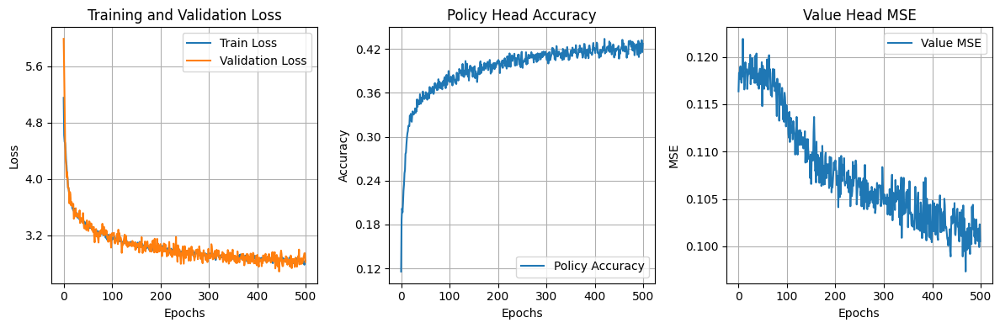

In [ ]:
import matplotlib.ticker as ticker

with keras.utils.custom_object_scope({'CBAM': CBAM}):
    best_model = keras.models.load_model('go_best_model.h5')

# Save learning curves
plt.figure(figsize=(12, 4))

# Training and Validation Loss
plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))

# Policy Head Accuracy
plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))

# Value Head MSE
plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

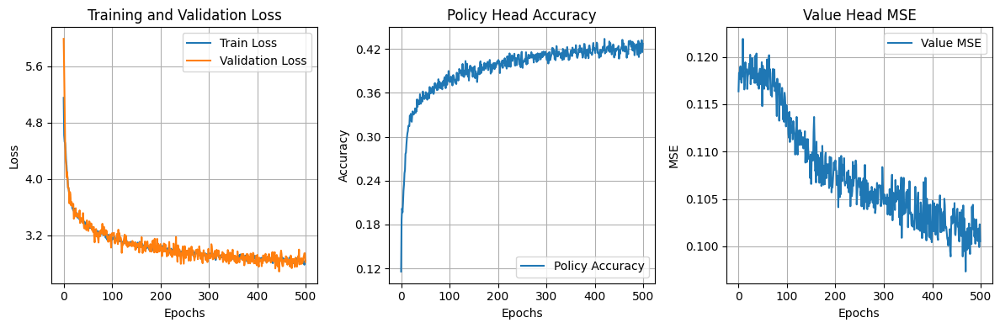

In [ ]:
import pickle
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Load the training logs from the file
file_path = '/content/training_inceptionlogs.pkl'

with open(file_path, 'rb') as file:
    training_logs = pickle.load(file)

# Save learning curves
plt.figure(figsize=(12, 4))

# Training and Validation Loss
plt.subplot(1, 3, 1)
plt.plot(training_logs['loss'], label='Train Loss')
plt.plot(training_logs['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))

# Policy Head Accuracy
plt.subplot(1, 3, 2)
plt.plot(training_logs['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))

# Value Head MSE
plt.subplot(1, 3, 3)
plt.plot(training_logs['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# **Mnasnet**

### Model Architecture Overview

This model is a lightweight convolutional architecture inspired by **MnasNet**, tailored for the game of **Go** under a strict 100,000-parameter constraint. It processes a **19×19×31** input tensor representing the board state with multiple feature planes.

**Architecture breakdown:**

- **Input Layer**  
  A 3×3 convolution with `ReLU` activation, followed by batch normalization, pre-processes the input and sets up a compact feature space.

- **MnasNet Blocks with Attention ×7**  
  Each block includes:
  - A 1×1 pointwise convolution for channel expansion  
  - A **depthwise convolution** with kernel size 3×3 for efficient spatial filtering  
  - A 1×1 projection layer to compress channels  
  - A **Squeeze-and-Excitation (SE) block** for channel recalibration  
  - A **channel attention mechanism** to emphasize informative channels  
  - A **residual connection** when input/output shapes match, preserving identity mappings

- **Policy Head**  
  - 1×1 convolution with ReLU activation  
  - Batch normalization  
  - 1×1 projection to 1 channel  
  - Flatten + softmax → outputs a probability distribution over **361 board positions**

- **Value Head**  
  - Global average pooling  
  - Dense layer with ReLU activation  
  - Dropout for regularization  
  - Final dense layer with sigmoid → predicts the **win probability** for the current player

This design combines **depthwise convolutions**, **expansion-projection bottlenecks**, and **channel attention** for an expressive yet compact representation. With only **33 base filters**, the model remains efficient while capturing essential Go board patterns.


# ================================
#         Architecture
# ================================



In [ ]:
filters = 33
blocks = 7

# SE Block
def SE_Block(inputs, ratio=16):
    filters = inputs.shape[-1]
    se = layers.GlobalAveragePooling2D()(inputs)
    se = layers.Reshape((1, 1, filters))(se)
    se = layers.Dense(filters // ratio, activation='relu')(se)
    se = layers.Dense(filters, activation='sigmoid')(se)
    return layers.Multiply()([inputs, se])

# Channel Attention Block
def channel_attention(inputs, ratio=8):
    filters = inputs.shape[-1]
    x = layers.GlobalAveragePooling2D()(inputs)
    x = layers.Reshape((1, 1, filters))(x)
    x = layers.Dense(filters // ratio, activation='relu')(x)
    x = layers.Dense(filters, activation='sigmoid')(x)
    return layers.Multiply()([inputs, x])

# Bloc MnasNet avec attention
def mnasnet_block_with_attention(inputs, filters, kernel_size, expansion_factor):
    x = layers.Conv2D(filters * expansion_factor, (1, 1), padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.DepthwiseConv2D(kernel_size, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)

    x = SE_Block(x)
    x = channel_attention(x)  # Ajout de l'attention basée sur les canaux

    if inputs.shape[-1] == filters:
        x = layers.Add()([inputs, x])

    return x

# Input layer
input_layer = keras.Input(shape=(19, 19, planes), name='board')
x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(input_layer)
x = layers.BatchNormalization()(x)

# Stack of MnasNet blocks with attention
for _ in range(blocks):
    x = mnasnet_block_with_attention(x, filters, (3, 3), expansion_factor=4)

# Policy head
policy_head = layers.Conv2D(128, (1, 1), use_bias=False, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(80, activation='relu')(value_head)
value_head = layers.Dropout(0.3)(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_116 (Conv2D)         (None, 19, 19, 33)           9207      ['board[0][0]']               
                                                                                                  
 batch_normalization_53 (Ba  (None, 19, 19, 33)           132       ['conv2d_116[0][0]']          
 tchNormalization)                                                                                
                                                                                                  
 conv2d_117 (Conv2D)         (None, 19, 19, 132)          4356      ['batch_normalization_53

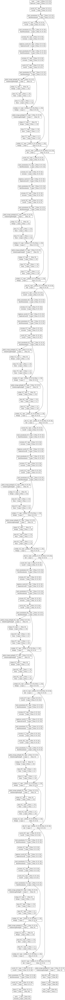

In [ ]:
plot_model(
    model,
    to_file="mnasnet_architecture.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
    dpi=100
)

try:
    display(Image(filename="mnasnet_architecture.png"))
except Exception as e:
    print("Architecture enregistrée sous 'mnasnet_architecture.png'.")
    print(f"(Affichage non supporté ici. Erreur : {e})")

# ================================
#          🏋️‍♂️ TRAINING
# ================================



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 19, 19, 33)           9207      ['board[0][0]']               
                                                                                                  
 batch_normalization (Batch  (None, 19, 19, 33)           132       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 19, 19, 132)          4356      ['batch_normalization[0][0

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


141/141 [==============================] - 31s 55ms/step - loss: 5.2682 - policy_loss: 4.5652 - value_loss: 0.6977 - policy_categorical_accuracy: 0.0977 - value_mse: 0.1208 - val_loss: 5.9160 - val_policy_loss: 5.2211 - val_value_loss: 0.6895 - val_policy_categorical_accuracy: 0.1290 - val_value_mse: 0.1257 - lr: 0.0010
Epoch 2/500
141/141 [==============================] - 6s 40ms/step - loss: 4.3689 - policy_loss: 3.6711 - value_loss: 0.6923 - policy_categorical_accuracy: 0.2032 - value_mse: 0.1209 - val_loss: 5.0374 - val_policy_loss: 4.3432 - val_value_loss: 0.6889 - val_policy_categorical_accuracy: 0.1850 - val_value_mse: 0.1187 - lr: 0.0010
Epoch 3/500
141/141 [==============================] - 6s 40ms/step - loss: 4.1116 - policy_loss: 3.4171 - value_loss: 0.6891 - policy_categorical_accuracy: 0.2426 - value_mse: 0.1189 - val_loss: 4.4188 - val_policy_loss: 3.7223 - val_value_loss: 0.6910 - val_policy_categorical_accuracy: 0.1990 - val_value_mse: 0.1202 - lr: 0.0010
Epoch 4/500


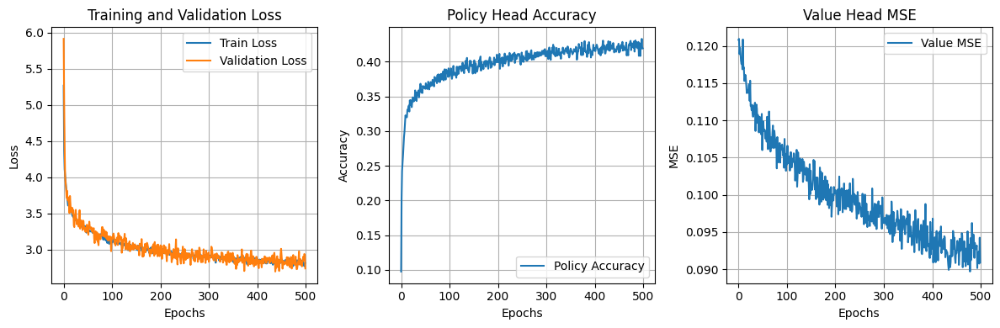

In [ ]:
import os
import gc
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import pickle
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
import golois
import absl.logging

absl.logging.set_verbosity(absl.logging.ERROR)

# Dimensions
planes = 31
moves = 361
N = 10000
epochs = 500
batch = 64
filters = 33
blocks = 7
reg_strength = 0.0001
max_params = 100000

# Data generation
np.random.seed(42)
input_data = np.random.randint(2, size=(N, 19, 19, planes)).astype('float32')
policy = keras.utils.to_categorical(np.random.randint(moves, size=(N,)))
value = np.random.randint(2, size=(N,)).astype('float32')
end = np.random.randint(2, size=(N, 19, 19, 2)).astype('float32')
groups = np.zeros((N, 19, 19, 1)).astype('float32')

golois.getValidation(input_data, policy, value, end)

# SE Block
def SE_Block(inputs, ratio=16):
    filters = inputs.shape[-1]
    se = layers.GlobalAveragePooling2D()(inputs)
    se = layers.Reshape((1, 1, filters))(se)
    se = layers.Dense(filters // ratio, activation='relu')(se)
    se = layers.Dense(filters, activation='sigmoid')(se)
    return layers.Multiply()([inputs, se])

# Channel Attention Block
def channel_attention(inputs, ratio=8):
    filters = inputs.shape[-1]
    x = layers.GlobalAveragePooling2D()(inputs)
    x = layers.Reshape((1, 1, filters))(x)
    x = layers.Dense(filters // ratio, activation='relu')(x)
    x = layers.Dense(filters, activation='sigmoid')(x)
    return layers.Multiply()([inputs, x])

# Bloc MnasNet avec attention
def mnasnet_block_with_attention(inputs, filters, kernel_size, expansion_factor):
    x = layers.Conv2D(filters * expansion_factor, (1, 1), padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.DepthwiseConv2D(kernel_size, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)

    x = SE_Block(x)
    x = channel_attention(x)  # Adding channel-based attention

    if inputs.shape[-1] == filters:
        x = layers.Add()([inputs, x])

    return x

# Input layer
input_layer = keras.Input(shape=(19, 19, planes), name='board')
x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(input_layer)
x = layers.BatchNormalization()(x)

# Stack of MnasNet blocks with attention
for _ in range(blocks):
    x = mnasnet_block_with_attention(x, filters, (3, 3), expansion_factor=4)

# Policy head
policy_head = layers.Conv2D(128, (1, 1), use_bias=False, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(80, activation='relu')(value_head)
value_head = layers.Dropout(0.3)(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

# Cosine Annealing Scheduler
def cosine_annealing(epoch, initial_lr=0.001, epochs_per_cycle=50):
    return initial_lr / 2 * (np.cos(np.pi * (epoch % epochs_per_cycle) / epochs_per_cycle) + 1)

# Callback Keras pour le Learning Rate Scheduler
lr_scheduler = LearningRateScheduler(lambda epoch, _: cosine_annealing(epoch, initial_lr=0.001, epochs_per_cycle=50))


# Compilate model
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              metrics={'policy': 'categorical_accuracy', 'value': ['mse']})

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-6)

model.summary()

# Callbacks
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint('go_best_model.h5', monitor='val_loss', save_best_only=True, mode='min', save_weights_only=False)

# Training
history_dict = {'loss': [], 'val_loss': [], 'policy_categorical_accuracy': [], 'value_mse': []}

for i in range(1, epochs + 1):
    print(f'Epoch {i}/{epochs}')
    golois.getBatch(input_data, policy, value, end, groups, i * N)
    history = model.fit(input_data, {'policy': policy, 'value': value}, epochs=1, batch_size=batch, validation_split=0.1, callbacks=[checkpoint, early_stopping, lr_scheduler], verbose=1)

    history_dict['loss'].append(history.history['loss'][0])
    history_dict['val_loss'].append(history.history['val_loss'][0])
    history_dict['policy_categorical_accuracy'].append(history.history['policy_categorical_accuracy'][0])
    history_dict['value_mse'].append(history.history['value_mse'][0])

    if i % 5 == 0:
        gc.collect()

    if i % 20 == 0:
        golois.getValidation(input_data, policy, value, end)
        val = model.evaluate(input_data, [policy, value], verbose=0, batch_size=batch)
        print(f"Validation: {val}")

# Save logs during training
with open('training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

# Load best model
best_model = keras.models.load_model('go_best_model.h5')

# Save learning curves
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# Save logs again at the end
with open('final_training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

Max Policy Accuracy: 0.4331111013889313


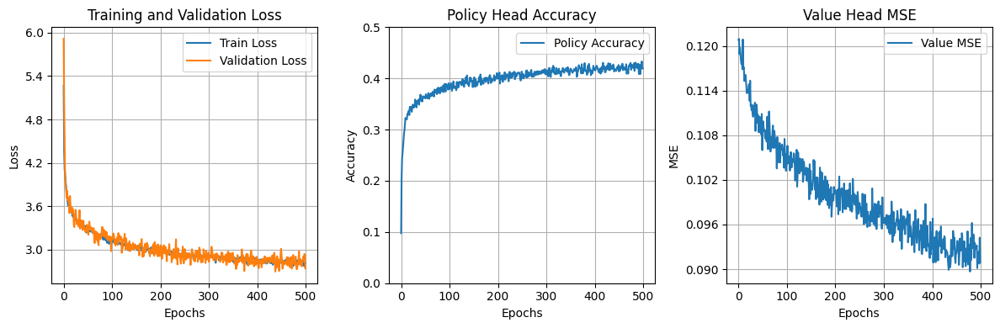

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import keras

# Load best model
best_model = keras.models.load_model('go_best_model.h5')


print("Max Policy Accuracy:", max(history_dict['policy_categorical_accuracy']))

# Save learning curves
plt.figure(figsize=(12, 4))

# Training and Validation Loss
plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

# Policy Head Accuracy
plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.ylim(0, 0.5)
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

# Value Head MSE
plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# **Normalization-Free Networks (NFN)**

### 🔍 Model Architecture Overview

This model is a lightweight **Transformer-based** architecture adapted for the game of **Go** under a strict 100,000-parameter constraint. It leverages the principles from the paper **"Transformers without Normalization"** by Jiachen Zhu, Xinlei Chen, Kaiming He, Yann LeCun, and Zhuang Liu (Meta AI, 2025), eliminating all normalization layers while maintaining stable training.

It processes a **19×19×31** input tensor representing the board state, which is projected into a sequence of 361 tokens.

**Architecture breakdown:**

- **Input Layer**  
  - A 3×3 convolution projects the input to a defined embedding dimension  
  - The 19×19 grid is reshaped into a **sequence of 361 tokens**

- **Transformer Encoder Blocks × *n***  
  Each block includes:
  - **Multi-Head Self-Attention**  
  - A **Dynamic Tanh (DyT)** activation instead of LayerNorm or BatchNorm  
  - A **Feed-Forward Network (FFN)** with ReLU + DyT  
  - **Residual connections** wrap both the attention and FFN sublayers  
  - ❗ **No normalization is used**, staying true to the Meta paper

- **Policy Head**  
  - Takes the embedding from the first token (CLS-style)  
  - Fully connected layer with softmax → outputs a distribution over **361 board positions**

- **Value Head**  
  - Global average pooling over all tokens  
  - Two dense layers with ReLU and sigmoid → predicts the **win probability** for the current player

This architecture explores the emerging idea of **normalization-free Transformers**, aiming to reduce computational overhead and simplify training while preserving performance — an especially promising direction under strict parameter budgets.

**⚠️ Note:** Unfortunately, due to time constraints, we were not able to fully resolve implementation issues. The original paper was implemented in **PyTorch**, and certain dynamic operations such as `DyT` are not yet fully compatible with TensorFlow. As a result, this version could not be validated in our TensorFlow-based pipeline.

# ================================
#         Architecture
# ================================



In [ ]:
# Dynamic Tanh (DyT) Layer
class DyT(layers.Layer):
    def __init__(self, channels, **kwargs):
        super(DyT, self).__init__(**kwargs)
        self.alpha = self.add_weight(shape=(1,), initializer='ones', trainable=True)
        self.gamma = self.add_weight(shape=(channels,), initializer='ones', trainable=True)
        self.beta = self.add_weight(shape=(channels,), initializer='zeros', trainable=True)

    def call(self, inputs):
        return self.gamma * tf.math.tanh(self.alpha * inputs) + self.beta

# Transformer Encoder Block with DyT
def transformer_block(inputs, embed_dim, num_heads, ff_dim):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(inputs, inputs)
    attn_output = DyT(embed_dim)(attn_output)
    x = layers.Add()([inputs, attn_output])

    ffn_output = layers.Dense(ff_dim, activation='relu')(x)
    ffn_output = layers.Dense(embed_dim)(ffn_output)
    ffn_output = DyT(embed_dim)(ffn_output)
    x = layers.Add()([x, ffn_output])
    return x

# Transformer models
input_layer = keras.Input(shape=(19, 19, planes), name='board')
x = layers.Conv2D(embed_dim, (3, 3), padding='same', kernel_regularizer=regularizers.l2(reg_strength))(input_layer)
x = layers.Reshape((361, embed_dim))(x)

# Transformer layers
for _ in range(num_layers):
    x = transformer_block(x, embed_dim, num_heads, ff_dim)

# Policy head
policy_head = layers.Dense(moves, activation='softmax', name='policy')(x[:, 0, :])

# Value head
value_head = layers.GlobalAveragePooling1D()(x)
value_head = layers.Dense(50, activation='relu')(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              loss_weights={'policy': 1.0, 'value': 1.0},
              metrics={'policy': 'categorical_accuracy', 'value': 'mse'})

model.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_135 (Conv2D)         (None, 19, 19, 64)           17920     ['board[0][0]']               
                                                                                                  
 reshape_27 (Reshape)        (None, 361, 64)              0         ['conv2d_135[0][0]']          
                                                                                                  
 multi_head_attention_8 (Mu  (None, 361, 64)              66368     ['reshape_27[0][0]',          
 ltiHeadAttention)                                                   'reshape_27[0][0]']    

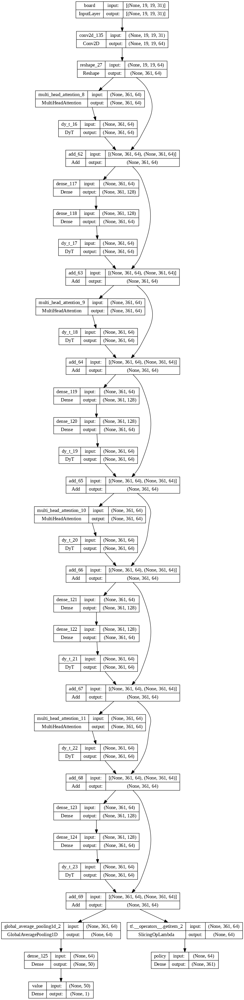

In [ ]:
plot_model(
    model,
    to_file="free_architecture.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
    dpi=100
)
try:
    display(Image(filename="free_architecture.png"))
except Exception as e:
    print("Architecture enregistrée sous 'free_architecture.png'.")
    print(f"(Affichage non supporté ici. Erreur : {e})")

# ================================
#          🏋️‍♂️ TRAINING
# ================================



In [ ]:
import os
import gc
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
import matplotlib.pyplot as plt
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint
import golois
import absl.logging

absl.logging.set_verbosity(absl.logging.ERROR)

# Dimensions
planes = 31
moves = 361
N = 10000
epochs = 500
batch = 128
embed_dim = 64
num_heads = 4
ff_dim = 128
num_layers = 4
reg_strength = 0.00001

# Data generation
input_data = np.random.randint(2, size=(N, 19, 19, planes)).astype('float32')
policy = keras.utils.to_categorical(np.random.randint(moves, size=(N,)))
value = np.random.randint(2, size=(N,)).astype('float32')
end = np.random.randint(2, size=(N, 19, 19, 2)).astype('float32')
groups = np.zeros((N, 19, 19, 1)).astype('float32')

print("getValidation", flush=True)
golois.getValidation(input_data, policy, value, end)

# Dynamic Tanh (DyT) Layer
class DyT(layers.Layer):
    def __init__(self, channels, **kwargs):
        super(DyT, self).__init__(**kwargs)
        self.alpha = self.add_weight(shape=(1,), initializer='ones', trainable=True)
        self.gamma = self.add_weight(shape=(channels,), initializer='ones', trainable=True)
        self.beta = self.add_weight(shape=(channels,), initializer='zeros', trainable=True)

    def call(self, inputs):
        return self.gamma * tf.math.tanh(self.alpha * inputs) + self.beta

# Transformer Encoder Block with DyT
def transformer_block(inputs, embed_dim, num_heads, ff_dim):
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(inputs, inputs)
    attn_output = DyT(embed_dim)(attn_output)
    x = layers.Add()([inputs, attn_output])

    ffn_output = layers.Dense(ff_dim, activation='relu')(x)
    ffn_output = layers.Dense(embed_dim)(ffn_output)
    ffn_output = DyT(embed_dim)(ffn_output)
    x = layers.Add()([x, ffn_output])
    return x

# Transformer model
input_layer = keras.Input(shape=(19, 19, planes), name='board')
x = layers.Conv2D(embed_dim, (3, 3), padding='same', kernel_regularizer=regularizers.l2(reg_strength))(input_layer)
x = layers.Reshape((361, embed_dim))(x)

# Transformer layers
for _ in range(num_layers):
    x = transformer_block(x, embed_dim, num_heads, ff_dim)

# Policy head
policy_head = layers.Dense(moves, activation='softmax', name='policy')(x[:, 0, :])

# Value head
value_head = layers.GlobalAveragePooling1D()(x)
value_head = layers.Dense(50, activation='relu')(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              loss_weights={'policy': 1.0, 'value': 1.0},
              metrics={'policy': 'categorical_accuracy', 'value': 'mse'})

model.summary()

# Callbacks
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint('go_best_model.h5', monitor='val_loss', save_best_only=True, mode='min', save_weights_only=False)

# Training loop
history_dict = {'loss': [], 'val_loss': [], 'policy_categorical_accuracy': [], 'value_mse': []}

for i in range(1, epochs + 1):
    print(f'Epoch {i}/{epochs}')
    golois.getBatch(input_data, policy, value, end, groups, i * N)
    history = model.fit(input_data, {'policy': policy, 'value': value}, epochs=1, batch_size=batch, validation_split=0.1, callbacks=[checkpoint, early_stopping], verbose=1)

    history_dict['loss'].append(history.history['loss'][0])
    history_dict['val_loss'].append(history.history['val_loss'][0])
    history_dict['policy_categorical_accuracy'].append(history.history['policy_categorical_accuracy'][0])
    history_dict['value_mse'].append(history.history['value_mse'][0])

    if i % 5 == 0:
        gc.collect()

# Loading best model
best_model = keras.models.load_model('go_best_model.h5', custom_objects={'DyT': DyT})

# Sauvegarde des courbes d'apprentissage
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

getValidation
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 19, 19, 64)           17920     ['board[0][0]']               
                                                                                                  
 reshape (Reshape)           (None, 361, 64)              0         ['conv2d[0][0]']              
                                                                                                  
 multi_head_attention (Mult  (None, 361, 64)              66368     ['reshape[0][0]',             
 iHeadAttention)                                                     'reshape[0]

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


ValueError: Unable to synchronously create dataset (name already exists)

# **Hybrid CNN + Linformer**

## Model Architecture Overview — Hybrid CNN + Linformer

This model is a lightweight hybrid architecture that combines **convolutional residual blocks**, **Squeeze-and-Excitation (SE) mechanisms**, and a **Linformer-based self-attention layer**, tailored for the game of **Go** under a strict 100,000-parameter constraint. It processes a **19×19×31** input tensor representing the board state.

**Architecture breakdown:**

- **Input Layer**  
  - A 3×3 convolution with ReLU activation followed by batch normalization initializes the spatial feature maps.

- **Residual CNN Blocks ×4**  
  Each block contains:
  - Two 3×3 convolutions with ReLU activation  
  - **Batch normalization** after each convolution  
  - A **residual skip connection** for training stability  
  - A **Squeeze-and-Excitation (SE) block** to recalibrate feature maps across channels

- **Linformer Attention Block**  
  - The spatial 19×19 features are flattened into a sequence of 361 tokens  
  - A **Multi-Head Attention mechanism** captures long-range dependencies efficiently  
  - Followed by two dense layers and layer normalization to form a compact Linformer encoder  
  - The output is reshaped back into 2D format for further processing

- **Policy Head**  
  - 1×1 convolution with ReLU activation  
  - Batch normalization  
  - 1×1 projection to a single channel  
  - Flatten + softmax → outputs a probability distribution over **361 board positions**

- **Value Head**  
  - Global average pooling  
  - Dense layer with ReLU activation  
  - Dropout for regularization  
  - Final dense layer with sigmoid → predicts the **win probability** for the current player

This architecture leverages the strengths of both **CNNs** (for local spatial processing) and **Linformer attention** (for efficient global interactions), while maintaining a low parameter count through careful use of 1×1 projections and attention-efficient mechanisms. With only **32 base filters** and 4 residual blocks, it remains compact and suitable for real-time Go agents.


# ================================
#         Architecture
# ================================



In [ ]:
filters = 32
blocks = 4


def residual_block(x, filters):
    """Ajout de connexions résiduelles pour stabiliser l'entraînement"""
    skip = x
    x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    return layers.Add()([x, skip])

def SE_Block(inputs, ratio=16):
    """Squeeze-and-Excitation Block pour améliorer les dépendances de canal"""
    filters = inputs.shape[-1]
    se = layers.GlobalAveragePooling2D()(inputs)
    se = layers.Reshape((1, 1, filters))(se)
    se = layers.Dense(filters // ratio, activation='relu')(se)
    se = layers.Dense(filters, activation='sigmoid')(se)
    return layers.Multiply()([inputs, se])

def linformer_block(inputs, embed_dim=32, num_heads=2):
    """Linformer Self-Attention Block (réduit)"""
    seq_len = inputs.shape[1] * inputs.shape[2]  # 19x19 = 361
    x = layers.Reshape((seq_len, inputs.shape[-1]))(inputs)  # Spatial alignment
    attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim // num_heads)(x, x)
    attn = layers.Add()([x, attn])
    attn = layers.LayerNormalization()(attn)
    x = layers.Dense(embed_dim, activation='relu')(attn)
    x = layers.Dense(inputs.shape[-1])(x)
    x = layers.Add()([attn, x])
    x = layers.LayerNormalization()(x)
    return layers.Reshape((19, 19, inputs.shape[-1]))(x)

# Model Hybrid CNN + Linformer + SE Block
input_layer = keras.Input(shape=(19, 19, planes), name='board')

# initial convolution
x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(input_layer)
x = layers.BatchNormalization()(x)

# Stacking CNN blocks with residual connections and SE Blocks
for _ in range(blocks):
    x = residual_block(x, filters)
    x = SE_Block(x)

# Linformer added after CNNs
x = linformer_block(x, embed_dim=32, num_heads=2)

# Policy Head
policy_head = layers.Conv2D(32, (1, 1), use_bias=False, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Enhanced Value Head (with `sigmoid` and `binary_crossentropy`)
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(80, activation='relu')(value_head)
value_head = layers.Dropout(0.3)(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)  # Back to sigmoïd

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

model.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_147 (Conv2D)         (None, 19, 19, 32)           8928      ['board[0][0]']               
                                                                                                  
 batch_normalization_86 (Ba  (None, 19, 19, 32)           128       ['conv2d_147[0][0]']          
 tchNormalization)                                                                                
                                                                                                  
 conv2d_148 (Conv2D)         (None, 19, 19, 32)           9216      ['batch_normalization_8

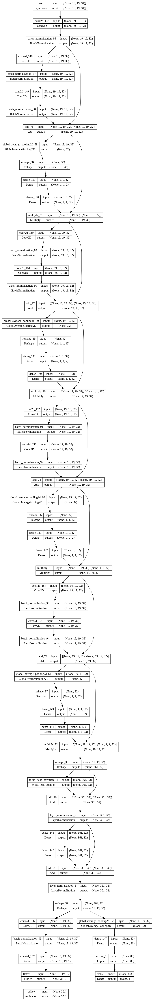

In [ ]:
plot_model(
    model,
    to_file="Hybrid CNN + Linformer_architecture.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
    dpi=100
)

try:
    display(Image(filename="Hybrid CNN + Linformer_architecture.png"))
except Exception as e:
    print("Architecture enregistrée sous 'Hybrid CNN + Linformer.png'.")
    print(f"(Affichage non supporté ici. Erreur : {e})")

# ================================
#          🏋️‍♂️ TRAINING
# ================================



Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_91 (Conv2D)          (None, 19, 19, 32)           8928      ['board[0][0]']               
                                                                                                  
 batch_normalization_82 (Ba  (None, 19, 19, 32)           128       ['conv2d_91[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 conv2d_92 (Conv2D)          (None, 19, 19, 32)           9216      ['batch_normalization_82

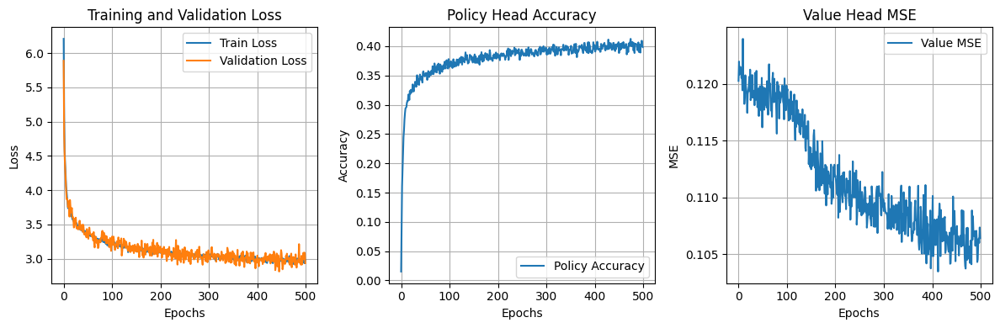

In [ ]:
import os
import gc
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import pickle
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
import golois
import absl.logging


absl.logging.set_verbosity(absl.logging.ERROR)

# Hyperparamètres
planes = 31
moves = 361
N = 10000
epochs = 500
batch = 64
filters = 32
blocks = 4
reg_strength = 0.0001
max_params = 100000

# Data generation
np.random.seed(42)
input_data = np.random.randint(2, size=(N, 19, 19, planes)).astype('float32')
policy = keras.utils.to_categorical(np.random.randint(moves, size=(N,)))
value = np.random.randint(2, size=(N,)).astype('float32')
end = np.random.randint(2, size=(N, 19, 19, 2)).astype('float32')
groups = np.zeros((N, 19, 19, 1)).astype('float32')

def residual_block(x, filters):
    """Ajout de connexions résiduelles pour stabiliser l'entraînement"""
    skip = x
    x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    return layers.Add()([x, skip])

def SE_Block(inputs, ratio=16):
    """Squeeze-and-Excitation Block pour améliorer les dépendances de canal"""
    filters = inputs.shape[-1]
    se = layers.GlobalAveragePooling2D()(inputs)
    se = layers.Reshape((1, 1, filters))(se)
    se = layers.Dense(filters // ratio, activation='relu')(se)
    se = layers.Dense(filters, activation='sigmoid')(se)
    return layers.Multiply()([inputs, se])

def linformer_block(inputs, embed_dim=32, num_heads=2):
    """Linformer Self-Attention Block (réduit)"""
    seq_len = inputs.shape[1] * inputs.shape[2]  # 19x19 = 361
    x = layers.Reshape((seq_len, inputs.shape[-1]))(inputs)
    attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim // num_heads)(x, x)
    attn = layers.Add()([x, attn])
    attn = layers.LayerNormalization()(attn)
    x = layers.Dense(embed_dim, activation='relu')(attn)
    x = layers.Dense(inputs.shape[-1])(x)
    x = layers.Add()([attn, x])
    x = layers.LayerNormalization()(x)
    return layers.Reshape((19, 19, inputs.shape[-1]))(x)

# Model Hybrid CNN + Linformer + SE Block
input_layer = keras.Input(shape=(19, 19, planes), name='board')

# Initial Convolution
x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(input_layer)
x = layers.BatchNormalization()(x)

# Stacking CNN blocks with residual connections and SE Blocks
for _ in range(blocks):
    x = residual_block(x, filters)
    x = SE_Block(x)

# Linformer added after CNNs
x = linformer_block(x, embed_dim=32, num_heads=2)

# Policy Head
policy_head = layers.Conv2D(32, (1, 1), use_bias=False, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Enhanced Value Head (with `sigmoid` and `binary_crossentropy`)
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(80, activation='relu')(value_head)
value_head = layers.Dropout(0.3)(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)  # Back to sigmoid

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

# Scheduler Cosine Annealing + Warmup
def cosine_annealing(epoch, initial_lr=0.0001, epochs_per_cycle=50):
    return initial_lr / 2 * (np.cos(np.pi * (epoch % epochs_per_cycle) / epochs_per_cycle) + 1)

lr_scheduler = LearningRateScheduler(lambda epoch, _: cosine_annealing(epoch, initial_lr=0.001, epochs_per_cycle=50))

# Compilation
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              metrics={'policy': 'categorical_accuracy', 'value': ['mse']})

# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-6)
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint('go_best_model.h5', monitor='val_loss', save_best_only=True, mode='min', save_weights_only=False)

model.summary()


# model training
history_dict = {'loss': [], 'val_loss': [], 'policy_categorical_accuracy': [], 'value_mse': []}

for i in range(1, epochs + 1):
    print(f'Epoch {i}/{epochs}')
    golois.getBatch(input_data, policy, value, end, groups, i * N)
    history = model.fit(input_data, {'policy': policy, 'value': value}, epochs=1, batch_size=batch, validation_split=0.1, callbacks=[checkpoint, early_stopping, lr_scheduler], verbose=1)

    history_dict['loss'].append(history.history['loss'][0])
    history_dict['val_loss'].append(history.history['val_loss'][0])
    history_dict['policy_categorical_accuracy'].append(history.history['policy_categorical_accuracy'][0])
    history_dict['value_mse'].append(history.history['value_mse'][0])

    if i % 5 == 0:
        gc.collect()

    if i % 20 == 0:
        golois.getValidation(input_data, policy, value, end)
        val = model.evaluate(input_data, [policy, value], verbose=0, batch_size=batch)
        print(f"Validation: {val}")



with open('training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)


best_model = keras.models.load_model('go_best_model.h5')

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

with open('final_training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

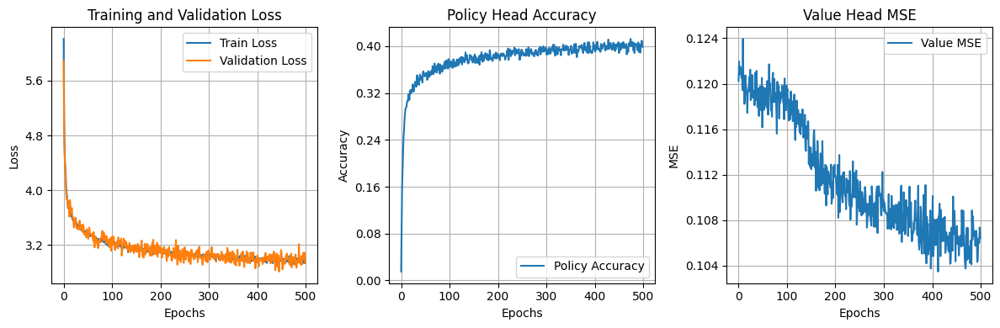

In [ ]:
import pickle
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker


file_path = '/content/Hybrid CNN + Linformer.pkl'

with open(file_path, 'rb') as file:
    training_logs = pickle.load(file)

# Save learning curves
plt.figure(figsize=(12, 4))

# Training and Validation Loss
plt.subplot(1, 3, 1)
plt.plot(training_logs['loss'], label='Train Loss')
plt.plot(training_logs['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))

# Policy Head Accuracy
plt.subplot(1, 3, 2)
plt.plot(training_logs['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
# Value Head MSE
plt.subplot(1, 3, 3)
plt.plot(training_logs['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=6))

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# **Efficientnetformer**

### Model Architecture Overview — EfficientFormer

This model is a lightweight architecture based on **EfficientFormer** principles, designed for the game of **Go** under a strict 100,000-parameter constraint. It combines depthwise convolutions, linear attention, and residual connections to achieve compact yet expressive representations. The model processes a **19×19×31** input tensor representing the board state.

**Architecture breakdown:**

- **Input Layer**  
  - A 3×3 convolution with ReLU activation and batch normalization initiates feature extraction from the board state.

- **EfficientFormer Blocks ×5**  
  Each block is designed to balance spatial encoding and attention:
  - A **1×1 pointwise convolution** expands the channel dimensions  
  - A **depthwise 3×3 convolution** encodes spatial features  
  - A **global linear attention** mechanism scales the representation using a learned attention vector (via `Dense + sigmoid`)  
  - A **1×1 projection** reduces the channel dimensions back to the base filter count  
  - A **residual connection** is applied when input/output channels match to aid training

- **Policy Head**  
  - A 1×1 convolution with ReLU activation  
  - Batch normalization  
  - A final 1×1 projection to 1 channel  
  - Flatten + softmax → outputs a probability distribution over **361 board positions**

- **Value Head**  
  - Global average pooling  
  - Dense layer with ReLU activation  
  - Dropout for regularization  
  - Final dense layer with sigmoid → predicts the **win probability**

This architecture is inspired by the **EfficientFormer** design, using **depthwise convolutions** and **attention via global context vectors**. With only **32 base filters** and 5 stacked blocks, the model stays within the 100k parameter constraint while offering effective spatial and contextual reasoning for Go decision-making.

# ================================
#         Architecture
# ================================


In [ ]:
filters = 32
blocks = 5
reg_strength = 0.0001


# Bloc EfficientFormer
def efficientformer_block(inputs, filters, expansion_factor=3):
    # 1. Expansion 1x1
    x = layers.Conv2D(filters * expansion_factor, (1, 1), padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # 2. Depthwise Separable Convolution 3x3
    x = layers.DepthwiseConv2D((3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # 3. Linear Attention (EfficientFormer)
    attn = layers.GlobalAveragePooling2D()(x)
    attn = layers.Dense(filters * expansion_factor, activation='sigmoid')(attn)
    attn = layers.Reshape((1, 1, filters * expansion_factor))(attn)
    x = layers.Multiply()([x, attn])

    # 4. 1x1 reduction
    x = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)

    # 5. Residual connection if possible
    if inputs.shape[-1] == filters:
        x = layers.Add()([inputs, x])

    return x


# Model EfficientFormer
input_layer = keras.Input(shape=(19, 19, planes), name='board')

# Initial convolution
x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(input_layer)
x = layers.BatchNormalization()(x)

# Stacking EfficientFormer blocks
for _ in range(blocks):
    x = efficientformer_block(x, filters, expansion_factor=3)

# Policy Head
policy_head = layers.Conv2D(64, (1, 1), use_bias=False, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value Head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(40, activation='relu')(value_head)
value_head = layers.Dropout(0.3)(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Create model
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

model.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_158 (Conv2D)         (None, 19, 19, 32)           8928      ['board[0][0]']               
                                                                                                  
 batch_normalization_96 (Ba  (None, 19, 19, 32)           128       ['conv2d_158[0][0]']          
 tchNormalization)                                                                                
                                                                                                  
 conv2d_159 (Conv2D)         (None, 19, 19, 96)           3072      ['batch_normalization_9

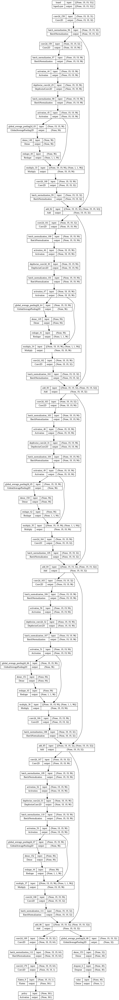

In [ ]:
plot_model(
    model,
    to_file="mnasnet_architecture.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
    dpi=100
)

try:
    display(Image(filename="effficientformer_architecture.png"))
except Exception as e:
    print("Architecture enregistrée sous 'efficientformer_architecture.png'.")
    print(f"(Affichage non supporté ici. Erreur : {e})")

# ================================
#          🏋️‍♂️ TRAINING
# ================================



Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 board (InputLayer)          [(None, 19, 19, 31)]         0         []                            
                                                                                                  
 conv2d_45 (Conv2D)          (None, 19, 19, 32)           8928      ['board[0][0]']               
                                                                                                  
 batch_normalization_60 (Ba  (None, 19, 19, 32)           128       ['conv2d_45[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 conv2d_46 (Conv2D)          (None, 19, 19, 96)           3072      ['batch_normalization_60

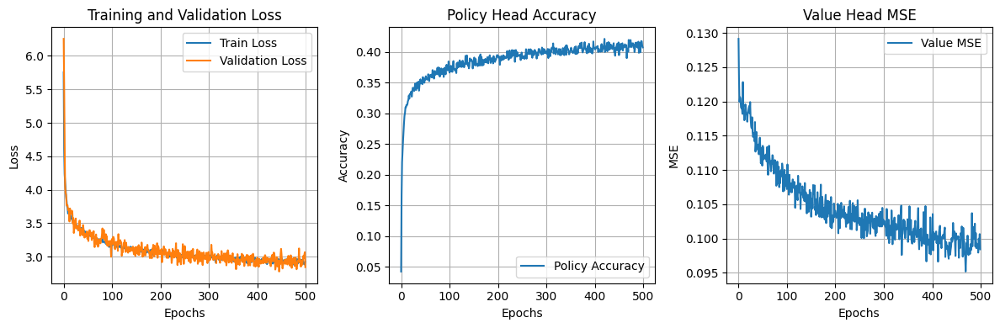

In [ ]:
import os
import gc
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import pickle
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
import golois
import absl.logging


absl.logging.set_verbosity(absl.logging.ERROR)

# Hyperparamètres
planes = 31
moves = 361
N = 10000
epochs = 500
batch = 64
filters = 32
blocks = 5
reg_strength = 0.0001
max_params = 100000

# Data generation
np.random.seed(42)
input_data = np.random.randint(2, size=(N, 19, 19, planes)).astype('float32')
policy = keras.utils.to_categorical(np.random.randint(moves, size=(N,)))
value = np.random.randint(2, size=(N,)).astype('float32')
end = np.random.randint(2, size=(N, 19, 19, 2)).astype('float32')
groups = np.zeros((N, 19, 19, 1)).astype('float32')

golois.getValidation(input_data, policy, value, end)

# Bloc EfficientFormer
def efficientformer_block(inputs, filters, expansion_factor=3):
    # 1. Expansion 1x1
    x = layers.Conv2D(filters * expansion_factor, (1, 1), padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # 2. Depthwise Separable Convolution 3x3
    x = layers.DepthwiseConv2D((3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # 3. Linear Attention (EfficientFormer)
    attn = layers.GlobalAveragePooling2D()(x)
    attn = layers.Dense(filters * expansion_factor, activation='sigmoid')(attn)
    attn = layers.Reshape((1, 1, filters * expansion_factor))(attn)
    x = layers.Multiply()([x, attn])

    # 4. Reduction 1x1
    x = layers.Conv2D(filters, (1, 1), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)

    # 5. Connexion Résiduelle si possible
    if inputs.shape[-1] == filters:
        x = layers.Add()([inputs, x])

    return x


# Modèle EfficientFormer
input_layer = keras.Input(shape=(19, 19, planes), name='board')

# Convolution Initiale
x = layers.Conv2D(filters, (3, 3), padding='same', use_bias=False, activation='relu')(input_layer)
x = layers.BatchNormalization()(x)

# Empilement des blocs EfficientFormer
for _ in range(blocks):
    x = efficientformer_block(x, filters, expansion_factor=3)

# Policy Head
policy_head = layers.Conv2D(64, (1, 1), use_bias=False, activation='relu', kernel_regularizer=regularizers.l2(reg_strength))(x)
policy_head = layers.BatchNormalization()(policy_head)
policy_head = layers.Conv2D(1, (1, 1))(policy_head)
policy_head = layers.Flatten()(policy_head)
policy_head = layers.Activation('softmax', name='policy')(policy_head)

# Value Head
value_head = layers.GlobalAveragePooling2D()(x)
value_head = layers.Dense(40, activation='relu')(value_head)
value_head = layers.Dropout(0.3)(value_head)
value_head = layers.Dense(1, activation='sigmoid', name='value')(value_head)

# Création du modèle
model = keras.Model(inputs=input_layer, outputs=[policy_head, value_head])

# Scheduler Cosine Annealing + Warmup
def cosine_annealing(epoch, initial_lr=0.0001, epochs_per_cycle=50):
    return initial_lr / 2 * (np.cos(np.pi * (epoch % epochs_per_cycle) / epochs_per_cycle) + 1)

lr_scheduler = LearningRateScheduler(lambda epoch, _: cosine_annealing(epoch, initial_lr=0.001, epochs_per_cycle=50))

# Compilation du modèle
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss={'policy': 'categorical_crossentropy', 'value': 'binary_crossentropy'},
              metrics={'policy': 'categorical_accuracy', 'value': ['mse']})

# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-6)
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint('go_best_model.h5', monitor='val_loss', save_best_only=True, mode='min', save_weights_only=False)


model.summary()

# model training
history_dict = {'loss': [], 'val_loss': [], 'policy_categorical_accuracy': [], 'value_mse': []}

for i in range(1, epochs + 1):
    print(f'Epoch {i}/{epochs}')
    golois.getBatch(input_data, policy, value, end, groups, i * N)
    history = model.fit(input_data, {'policy': policy, 'value': value}, epochs=1, batch_size=batch, validation_split=0.1, callbacks=[checkpoint, early_stopping, lr_scheduler], verbose=1)

    history_dict['loss'].append(history.history['loss'][0])
    history_dict['val_loss'].append(history.history['val_loss'][0])
    history_dict['policy_categorical_accuracy'].append(history.history['policy_categorical_accuracy'][0])
    history_dict['value_mse'].append(history.history['value_mse'][0])

    if i % 5 == 0:
        gc.collect()

    if i % 20 == 0:
        golois.getValidation(input_data, policy, value, end)
        val = model.evaluate(input_data, [policy, value], verbose=0, batch_size=batch)
        print(f"Validation: {val}")

with open('training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

best_model = keras.models.load_model('go_best_model.h5')

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# Sauvegarde finale des logs
with open('final_training_logs.pkl', 'wb') as f:
    pickle.dump(history_dict, f)

Max Policy Accuracy: 0.4216666519641876


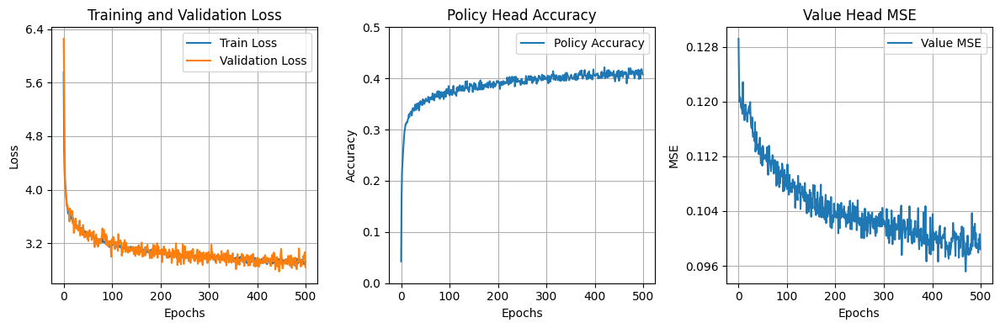

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import keras

# Load best model
best_model = keras.models.load_model('go_best_model.h5')

print("Max Policy Accuracy:", max(history_dict['policy_categorical_accuracy']))

# Save learning curves
plt.figure(figsize=(12, 4))

# Training and Validation Loss
plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

# Policy Head Accuracy
plt.subplot(1, 3, 2)
plt.plot(history_dict['policy_categorical_accuracy'], label='Policy Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Policy Head Accuracy')
plt.ylim(0, 0.5)
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

# Value Head MSE
plt.subplot(1, 3, 3)
plt.plot(history_dict['value_mse'], label='Value MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('Value Head MSE')
plt.grid()
plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))

plt.tight_layout()
plt.savefig('training_curves.png')
plt.show()

# ================================
#        METRICS
# ================================



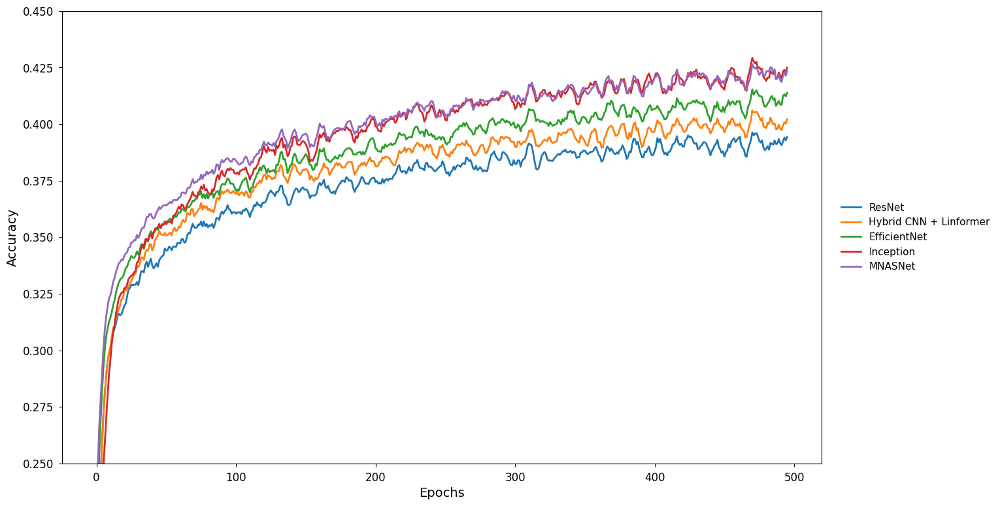

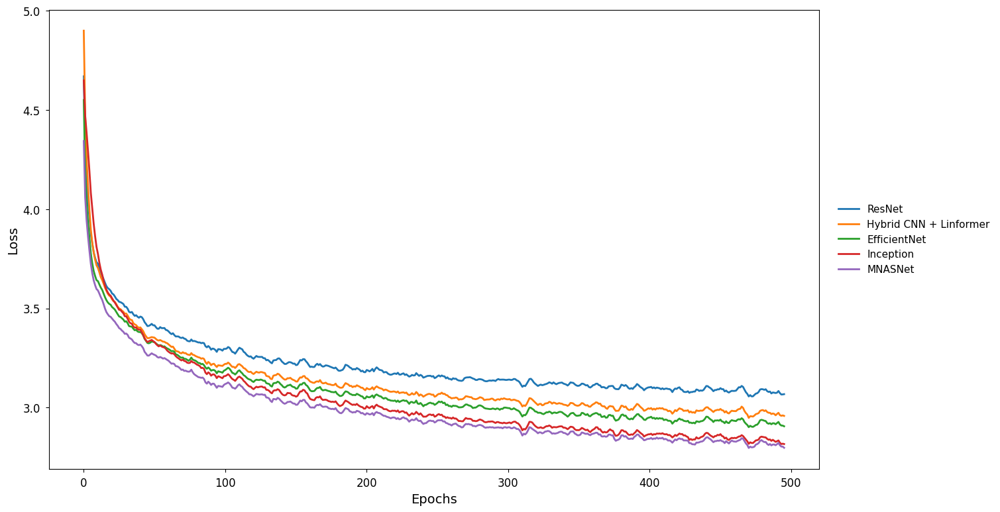

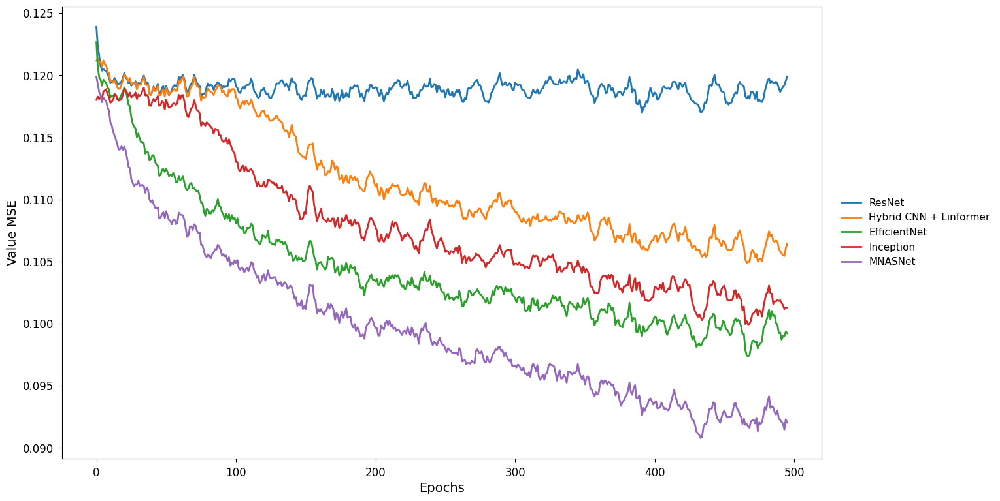

In [ ]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import math

# === Loading histories ===
model_files = {
    "ResNet": "/content/resnet.pkl",
    "Hybrid CNN + Linformer": "/content/Hybrid CNN + Linformer.pkl",
    "EfficientNet": "/content/efficientnet.pkl",
    "Inception": "/content/inceptionlogs.pkl",
    "MNASNet": "/content/mnasnet.pkl"
}

model_histories = {}
for model_name, path in model_files.items():
    with open(path, 'rb') as f:
        history = pickle.load(f)
        model_histories[model_name] = history

# === Smoothing with outlier management ===
def smooth(y, window=5):
    y = np.array(y)
    valid = np.isfinite(y) & (y > 1e-6)
    y_clean = y[valid]
    return np.convolve(y_clean, np.ones(window)/window, mode='valid')

# === Plot clean with automatic filtering ===

def plot_metric_clean(metric_key, ylabel, filename, ylim=None, smooth_window=5):
    plt.figure(figsize=(15, 9))
    for model_name, hist in model_histories.items():
        if metric_key in hist:
            y = hist[metric_key]
            y = [v for v in y if v is not None and not math.isnan(v) and v > 1e-6]
            if len(y) < smooth_window:
                continue
            y_smooth = smooth(y, smooth_window)
            plt.plot(range(len(y_smooth)), y_smooth, label=model_name, linewidth=2)

    plt.xlabel("Epochs", fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    if ylim:
        plt.ylim(ylim)

    # Legend
    leg = plt.legend(
        fontsize=11,
        frameon=False,
        loc='center left',
        bbox_to_anchor=(1.02, 0.5),
        borderaxespad=0
    )
    # Legend
    leg = plt.legend(
    fontsize=11,
    frameon=False,
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0
)
for line in leg.get_lines():
    line.set_linewidth(3)
    line.set_marker(None)




    plt.grid(True, linestyle="--", linewidth=0.5, alpha=0.3)
    plt.tight_layout()


    ax = plt.gca()
    ax.set_facecolor('white')
    plt.gcf().set_facecolor('white')

    plt.savefig(f"{filename}.pdf", bbox_inches='tight', transparent=True)
    plt.savefig(f"{filename}.png", dpi=400, bbox_inches='tight', transparent=True)
    plt.show()

# === 1. Accuracy ===
plot_metric_clean(
    metric_key="policy_categorical_accuracy",
    ylabel="Accuracy",
    filename="policy_accuracy_clean",
    ylim=(0.25, 0.45)
)

# === 2. Loss ===
plot_metric_clean(
    metric_key="loss",
    ylabel="Loss",
    filename="training_loss_clean"
)

# === 3. Value MSE ===
plot_metric_clean(
    metric_key="value_mse",
    ylabel="Value MSE",
    filename="value_mse_clean"
)

In [ ]:
metrics = {
    "policy_categorical_accuracy": "Policy Accuracy",
    "loss": "Training Loss",
    "value_mse": "Value MSE"
}

print("=== Max / Min per Model ===")
for metric_key, metric_name in metrics.items():
    print(f"\n--- {metric_name} ---")
    for model_name, history_dict in model_histories.items():
        if metric_key in history_dict:
            values = history_dict[metric_key]
            # Cleaning outlier values
            values = [v for v in values if v is not None and not math.isnan(v) and v > 1e-6]
            if values:
                if metric_key == "loss" or metric_key == "value_mse":
                    # For loss and mse, display the **minimum**
                    print(f"{model_name:30s} : min = {min(values):.4f}")
                else:
                    # For accuracy, display the **maximum**
                    print(f"{model_name:30s} : max = {max(values):.4f}")
            else:
                print(f"{model_name:30s} : ⚠️ No valid values")
        else:
            print(f"{model_name:30s} : ⚠️ Key '{metric_key}' missing")

=== Max / Min par modèle ===

--- Policy Accuracy ---
ResNet                         : max = 0.4032
Hybrid CNN + Linformer         : max = 0.4126
EfficientNet                   : max = 0.4217
Inception                      : max = 0.4340
MNASNet                        : max = 0.4331

--- Training Loss ---
ResNet                         : min = 3.0306
Hybrid CNN + Linformer         : min = 2.9243
EfficientNet                   : min = 2.8846
Inception                      : min = 2.7816
MNASNet                        : min = 2.7672

--- Value MSE ---
ResNet                         : min = 0.1153
Hybrid CNN + Linformer         : min = 0.1035
EfficientNet                   : min = 0.0952
Inception                      : min = 0.0973
MNASNet                        : min = 0.0897
